# Topic Modelling With Latent Dirichlet Allocation

# spaCy upgrade and package installation.

\Link on how to run Colab notebooks locally on your machine:<br>
https://research.google.com/colaboratory/local-runtimes.html

In [1]:
!pip install -U spacy==3.*
!python -m spacy download en_core_web_sm
!python -m spacy info

Defaulting to user installation because normal site-packages is not writeable
   ---------------------------------------- 0.0/12.1 MB ? eta -:--:--
   ---------------------------------------- 0.0/12.1 MB ? eta -:--:--
   ---------------------------------------- 0.0/12.1 MB 487.6 kB/s eta 0:00:25
   - -------------------------------------- 0.3/12.1 MB 2.8 MB/s eta 0:00:05
   ----- ---------------------------------- 1.6/12.1 MB 10.3 MB/s eta 0:00:02
   ---------------- ----------------------- 5.0/12.1 MB 24.7 MB/s eta 0:00:01
   -------------------------- ------------- 8.2/12.1 MB 32.6 MB/s eta 0:00:01
   ------------------------------------ --- 11.0/12.1 MB 65.6 MB/s eta 0:00:01
   ---------------------------------------- 12.1/12.1 MB 54.4 MB/s eta 0:00:00
  Attempting uninstall: spacy
    Found existing installation: spacy 3.7.4
    Uninstalling spacy-3.7.4:
      Successfully uninstalled spacy-3.7.4


  Consider adding this directory to PATH or, if you prefer to suppress this warning, use --no-warn-script-location.


Defaulting to user installation because normal site-packages is not writeable
     ---------------------------------------- 0.0/12.8 MB ? eta -:--:--
     ---------------------------------------- 0.0/12.8 MB ? eta -:--:--
     --------------------------------------- 0.0/12.8 MB 217.9 kB/s eta 0:00:59
     --------------------------------------- 0.1/12.8 MB 375.8 kB/s eta 0:00:34
      --------------------------------------- 0.2/12.8 MB 1.4 MB/s eta 0:00:09
     ------- -------------------------------- 2.5/12.8 MB 13.3 MB/s eta 0:00:01
     ---------------- ----------------------- 5.4/12.8 MB 23.1 MB/s eta 0:00:01
     --------------------------- ------------ 8.7/12.8 MB 29.2 MB/s eta 0:00:01
     ------------------------------------ -- 12.0/12.8 MB 65.2 MB/s eta 0:00:01
     --------------------------------------  12.8/12.8 MB 65.6 MB/s eta 0:00:01
     --------------------------------------- 12.8/12.8 MB 50.4 MB/s eta 0:00:00
[+] Download and installation successful
You can now load t

For topic modelling, we'll use **Gensim**, a popular topic modelling library originally authored by Radim Řehůřek. It has implementations for LDA and other models.<br>
https://radimrehurek.com/gensim/index.html

In [2]:
# Upgrade gensim in case.
# !pip install --upgrade numpy
!pip install -U gensim==4.*

Defaulting to user installation because normal site-packages is not writeable
   ---------------------------------------- 0.0/24.0 MB ? eta -:--:--
   ---------------------------------------- 0.0/24.0 MB ? eta -:--:--
   ---------------------------------------- 0.0/24.0 MB 217.9 kB/s eta 0:01:51
   ---------------------------------------- 0.0/24.0 MB 326.8 kB/s eta 0:01:14
   ---------------------------------------- 0.2/24.0 MB 913.1 kB/s eta 0:00:27
   ---------------------------------------- 0.3/24.0 MB 1.5 MB/s eta 0:00:17
   - -------------------------------------- 0.8/24.0 MB 3.2 MB/s eta 0:00:08
   --- ------------------------------------ 1.9/24.0 MB 6.9 MB/s eta 0:00:04
   ----- ---------------------------------- 3.5/24.0 MB 10.5 MB/s eta 0:00:02
   ------- -------------------------------- 4.5/24.0 MB 12.5 MB/s eta 0:00:02
   ---------- ----------------------------- 6.1/24.0 MB 14.5 MB/s eta 0:00:02
   ------------- -------------------------- 8.0/24.0 MB 17.1 MB/s eta 0:00:01
  

In [6]:
!pip install wordcloud

Defaulting to user installation because normal site-packages is not writeable
   ---------------------------------------- 0.0/300.2 kB ? eta -:--:--
   ---------------------------------------- 0.0/300.2 kB ? eta -:--:--
   --- ----------------------------------- 30.7/300.2 kB 660.6 kB/s eta 0:00:01
   --------------------- ------------------ 163.8/300.2 kB 2.0 MB/s eta 0:00:01
   ---------------------------------------- 300.2/300.2 kB 3.1 MB/s eta 0:00:00


  Consider adding this directory to PATH or, if you prefer to suppress this warning, use --no-warn-script-location.


In [7]:
import matplotlib.pyplot as plt
import pandas as pd
import random
import spacy

from gensim import models, corpora
from gensim import similarities
from gensim.models.coherencemodel import CoherenceModel
from wordcloud import WordCloud

# First pass at building an LDA topic model for our corpus

We'll use a corpus of over 90,000 CNN news articles originally compiled for training question answering models. I lightly processed them to remove some metadata and put them on Google Drive.
([original source](https://cs.nyu.edu/~kcho/DMQA/))
<br><br>
To retrieve the corpus from Google Drive, we'll use the **gdown** library which I've already installed:<br>
https://github.com/wkentaro/gdown

In [19]:
#!pip install gdown
#import gdown

In [13]:
import locale
def getpreferredencoding(do_setlocale = True):
    return "UTF-8"

locale.getpreferredencoding = getpreferredencoding

In [10]:
!pip install --upgrade --no-cache-dir gdown

Defaulting to user installation because normal site-packages is not writeable


  Consider adding this directory to PATH or, if you prefer to suppress this warning, use --no-warn-script-location.


In [21]:
# Download the CNN corpus on collab
#!gdown 'https://drive.google.com/uc?id=122fC9XpNwFKx0ryRVKJz5MWUTzA3Vpsf'

'gdown' is not recognized as an internal or external command,
operable program or batch file.


In [23]:
# # Download the CNN corpus on Jupyter Notebook locale #
output = "cnn_articles.txt"
gdown.download("https://drive.google.com/uc?id=122fC9XpNwFKx0ryRVKJz5MWUTzA3Vpsf", output)

Downloading...
From (original): https://drive.google.com/uc?id=122fC9XpNwFKx0ryRVKJz5MWUTzA3Vpsf
From (redirected): https://drive.google.com/uc?id=122fC9XpNwFKx0ryRVKJz5MWUTzA3Vpsf&confirm=t&uuid=ce8c3344-0bd7-465a-9e5e-b387ef413fd5
To: C:\Users\Sawan\Downloads\cnn_articles.txt
100%|██████████| 365M/365M [00:08<00:00, 42.5MB/s] 


'cnn_articles.txt'

The corpus is one large text file with each article in the corpus separated by an *@delimiter* string. We'll split the articles and place them in a list.

In [24]:
with open('cnn_articles.txt', 'r', encoding='utf8') as f:
  articles = f.read().split('@delimiter')

In [25]:
print(len(articles))

92579


In [26]:
print(articles[0])

 -- Children in war-ravaged Afghanistan are safer than those growing up in London or New York, NATO's top civilian envoy says.

Mark Sedwill, the senior civilian representative for NATO, made the comments on an episode of CBBC's "Newsround," which is airing Monday.

In the show -- a BBC current-affairs program for children -- several youngsters in Kabul, Afghanistan, say they are afraid of daily violence and the frequent explosions in their war-torn country.

In response, Sedwill says: "Here in Kabul, and other big cities actually, there are very few of these bombs. The children are probably safer here than they would be in London, New York or Glasgow or many other cities.

"Most children can go about their lives in safety. It's a very family-oriented society. So it is a little bit like a city of villages," he added.

A U.N. report released earlier this year seems to contradict Sedwill's assessment.

The February report, by the special representative for children and armed conflict, sa

In [27]:
print(articles[100])


 -- A tip led to Wednesday's arrest in Louisiana of a suspected serial bank robber dubbed the "Granddad Bandit," federal authorities said.

Michael Francis Mara, 52, was captured at his home in Baton Rouge, FBI Special Agent Sheila Thorne told CNN.

The FBI went to the residence to execute an arrest warrant when Mara retreated into the house, she said. "After six hours, he came out and was placed under arrest," she added.

The "Granddad Bandit" is wanted in at least 25 bank heists in 13 states -- from Virginia to Texas to Kansas -- since 2008, the FBI said in a statement. He was given the name because he appeared elderly, Thorne told CNN.

The bandit, described as balding, heavy and wearing glasses, captured the public's attention because of his non-threatening image and his nickname.

But federal authorities said he was anything but harmless. He would point to his waistband and indicate he had a gun, but it was unclear if he actually had one.

The Federal Bureau of Investigation's fi

Let's use a subset of the articles to speed things up but feel free to change the dataset size.

In [28]:
DATASET_SIZE = 10000
dataset = articles[:DATASET_SIZE]

Let's start off with a *blank* tokenizer with no further pipeline components to see if that's good enough.
<br><br>
We'll filter out punctuations, newlines, and any tokens containing non-alphabetic characters.

In [29]:
nlp = spacy.blank('en')

def basic_filter(tokenized_doc):
  return [t.text for t in tokenized_doc if
          not t.is_punct and \
          not t.is_space and \
          t.is_alpha]

We will leverage spaCy's **nlp.pipe** function which can process a corpus as a batch (or a series of batches) and use multiple processes. Here, we'll process our dataset as a batch across multiple processes, then run the tokenized **doc** objects through the *basic_filter* function. You can adjust **NUM_PROCESS** as you wish.<br><br>
Take a look at these link for ways to further optimize spaCy's pipeline:<br>
https://spacy.io/usage/processing-pipelines#processing<br>
https://spacy.io/api/language#pipe<br><br>
YouTube video from spaCy on using **nlp.pipe**: [Speed up spaCy pipelines via `nlp.pipe` - spaCy shorts](https://www.youtube.com/watch?v=OoZ-H_8vRnc)<br>
Tuning **nlp.pipe**: https://stackoverflow.com/questions/65850018/processing-text-with-spacy-nlp-pipe

In [30]:
NUM_PROCESS = 4

In [31]:
%%time
tokenized_articles = list(map(basic_filter, nlp.pipe(dataset, n_process=NUM_PROCESS)))

CPU times: total: 40.4 s
Wall time: 57 s


In [32]:
print(tokenized_articles[0])

['Children', 'in', 'war', 'ravaged', 'Afghanistan', 'are', 'safer', 'than', 'those', 'growing', 'up', 'in', 'London', 'or', 'New', 'York', 'NATO', 'top', 'civilian', 'envoy', 'says', 'Mark', 'Sedwill', 'the', 'senior', 'civilian', 'representative', 'for', 'NATO', 'made', 'the', 'comments', 'on', 'an', 'episode', 'of', 'CBBC', 'Newsround', 'which', 'is', 'airing', 'Monday', 'In', 'the', 'show', 'a', 'BBC', 'current', 'affairs', 'program', 'for', 'children', 'several', 'youngsters', 'in', 'Kabul', 'Afghanistan', 'say', 'they', 'are', 'afraid', 'of', 'daily', 'violence', 'and', 'the', 'frequent', 'explosions', 'in', 'their', 'war', 'torn', 'country', 'In', 'response', 'Sedwill', 'says', 'Here', 'in', 'Kabul', 'and', 'other', 'big', 'cities', 'actually', 'there', 'are', 'very', 'few', 'of', 'these', 'bombs', 'The', 'children', 'are', 'probably', 'safer', 'here', 'than', 'they', 'would', 'be', 'in', 'London', 'New', 'York', 'or', 'Glasgow', 'or', 'many', 'other', 'cities', 'Most', 'children

In [ ]:
print(tokenized_articles[100])

To start off, we'll go with 20 topics. With most topic models including LDA, there isn't a clear recipe on how to pick the optimal number of topics. The nature and composition of the data (e.g. average length of each document) has a major impact on how many topics are *interpretable* by a human. Often, it's best to go with something reasonable to begin with and then try different topic numbers.<br><br>For this corpus, I'm going with 20 topics which is a small amount relative to the corpus size, but my reasoning is that since this is a general mainstream news corpus, the topics themselves are going to be fairly broad.

In [33]:
NUM_TOPICS = 20

After tokenizing our text, the first step with Gensim is to construct a **Dictionary** mapping words to integer IDs.<br>
https://radimrehurek.com/gensim/corpora/dictionary.html<br><br>
Note: This is similar to the *fit* step we took with scikit-learn's vectorizers.

In [35]:
# Build a Dictionary of word<-->id mappings.
dictionary = corpora.Dictionary(tokenized_articles)
dictionary

In [36]:
type(dictionary)

gensim.corpora.dictionary.Dictionary

In [37]:
sample_token = 'news'
print(f'Id for \'{sample_token}\' token: {dictionary.token2id[sample_token]}')

Id for 'news' token: 1039


In [ ]:
sample_token = 'sports'
print(f'Id for \'{sample_token}\' token: {dictionary.token2id[sample_token]}')

In [ ]:
sample_token = 'politics'
print(f'Id for \'{sample_token}\' token: {dictionary.token2id[sample_token]}')

The next step is to create a frequency bag-of-words from each article using the **dictionary**'s *doc2bow* method. https://radimrehurek.com/gensim/corpora/dictionary.html#gensim.corpora.dictionary.Dictionary.doc2bow<br><br>

Note: This is similar to the *transform* step from scikit-learn's vectorizers.

In [38]:
%%time
corpus_bow = [dictionary.doc2bow(article) for article in tokenized_articles]
#corpus_bow

CPU times: total: 2.39 s
Wall time: 3.02 s


In [ ]:
type(corpus_bow)

Finally, we'll generate our base LDA model. Gensim's LDA model has a large number of optional parameters but for now, we'll keep it simple.<br>
https://radimrehurek.com/gensim/models/ldamodel.html?highlight=lda#module-gensim.models.ldamodel

In [39]:
%%time
lda_model = models.LdaModel(corpus=corpus_bow, num_topics=NUM_TOPICS, id2word=dictionary, random_state=1)
lda_model

CPU times: total: 26.2 s
Wall time: 14 s


Once our model is generated, we can view the topics inferred. By default, the model's *print_topics* method shows the top 20 topics and each topic's ten most significant words.<br>
https://radimrehurek.com/gensim/models/ldamodel.html?highlight=lda#gensim.models.ldamodel.LdaModel.print_topics

In [40]:
lda_model.print_topics()

[(0,
  '0.057*"the" + 0.035*"of" + 0.028*"to" + 0.023*"and" + 0.023*"in" + 0.021*"a" + 0.011*"that" + 0.010*"for" + 0.010*"is" + 0.008*"on"'),
 (1,
  '0.063*"the" + 0.031*"to" + 0.028*"of" + 0.026*"a" + 0.021*"and" + 0.017*"in" + 0.014*"that" + 0.011*"he" + 0.010*"said" + 0.010*"is"'),
 (2,
  '0.012*"the" + 0.007*"ETA" + 0.006*"of" + 0.004*"in" + 0.004*"and" + 0.004*"Basque" + 0.003*"a" + 0.003*"to" + 0.002*"The" + 0.002*"said"'),
 (3,
  '0.017*"the" + 0.012*"and" + 0.011*"to" + 0.010*"in" + 0.009*"a" + 0.008*"of" + 0.006*"said" + 0.005*"was" + 0.005*"is" + 0.004*"for"'),
 (4,
  '0.018*"the" + 0.011*"a" + 0.009*"to" + 0.009*"of" + 0.009*"Pacquiao" + 0.008*"I" + 0.007*"and" + 0.007*"in" + 0.006*"that" + 0.006*"is"'),
 (5,
  '0.031*"the" + 0.028*"a" + 0.028*"to" + 0.027*"and" + 0.025*"I" + 0.024*"her" + 0.021*"she" + 0.016*"of" + 0.015*"in" + 0.014*"was"'),
 (6,
  '0.010*"to" + 0.008*"the" + 0.007*"a" + 0.005*"and" + 0.005*"in" + 0.005*"of" + 0.003*"was" + 0.003*"said" + 0.003*"that" + 0

The first pass is pretty awful. The topics are dominated by stop words such that they essentially look all the same. Let's see if we can do better.

# Improving preprocessing for better results.

For our next attempt, we'll
- Remove stop words using the default spaCy stopword list. Given this is a corpus of news articles, there may be other stop words to consider such as salutations ("Mr", "Mrs"), and words related to quotes and thoughts ("say", "think"). But for this, we'll stick to defaults unless we see reason to do otherwise.
- Consider only the words the spaCy tagger flags as *nouns, verbs,* and *adjectives*. Including words with only certain POS tags is a common approach to improving topic models.
- Take the lemma.

In [41]:
nlp = spacy.load('en_core_web_sm', disable=['parser', 'ner'])
print(nlp)

def improved_filter(tokenized_doc):
  return [t.lemma_ for t in tokenized_doc if
          t.is_alpha and \
          not t.is_punct and \
          not t.is_space and \
          not t.is_stop and \
          t.pos_ in ['NOUN', 'VERB', 'ADJ']]

We will need to retokenize everything and rebuild the BOWs. Because we are now using the POS tagger, this will take longer. The "w_pos" in the variable names below just means "with part-of-speech".

In [45]:
import multiprocessing

In [46]:
tokenized_articles_w_pos = list(map(improved_filter, nlp.pipe(dataset)))
tokenized_articles_w_pos

[['child',
  'war',
  'ravage',
  'safe',
  'grow',
  'civilian',
  'envoy',
  'say',
  'senior',
  'civilian',
  'representative',
  'comment',
  'episode',
  'air',
  'current',
  'affair',
  'program',
  'child',
  'youngster',
  'afraid',
  'daily',
  'violence',
  'frequent',
  'explosion',
  'war',
  'tear',
  'country',
  'response',
  'say',
  'big',
  'city',
  'bomb',
  'child',
  'safe',
  'city',
  'child',
  'life',
  'safety',
  'family',
  'orient',
  'society',
  'little',
  'bit',
  'city',
  'village',
  'add',
  'report',
  'release',
  'year',
  'contradict',
  'assessment',
  'report',
  'special',
  'representative',
  'child',
  'armed',
  'conflict',
  'say',
  'child',
  'victim',
  'roadside',
  'attack',
  'crossfire',
  'militant',
  'international',
  'force',
  'air',
  'strike',
  'addition',
  'human',
  'shield',
  'recruit',
  'suicide',
  'bomber',
  'report',
  'say',
  'boy',
  'abuse',
  'exploit',
  'armed',
  'group',
  'girl',
  'school',
  'bur

In [47]:
%%time
dictionary_w_pos = corpora.Dictionary(tokenized_articles_w_pos)
dictionary_w_pos

CPU times: total: 594 ms
Wall time: 2.32 s


In [48]:
%%time
corpus_bow_w_pos = [dictionary_w_pos.doc2bow(article) for article in tokenized_articles_w_pos]
#corpus_bow_w_pos

CPU times: total: 750 ms
Wall time: 1.26 s


[[(0, 1),
  (1, 1),
  (2, 1),
  (3, 1),
  (4, 1),
  (5, 1),
  (6, 1),
  (7, 2),
  (8, 2),
  (9, 1),
  (10, 2),
  (11, 1),
  (12, 1),
  (13, 2),
  (14, 1),
  (15, 1),
  (16, 1),
  (17, 1),
  (18, 1),
  (19, 1),
  (20, 1),
  (21, 10),
  (22, 5),
  (23, 2),
  (24, 1),
  (25, 1),
  (26, 2),
  (27, 1),
  (28, 1),
  (29, 1),
  (30, 1),
  (31, 1),
  (32, 1),
  (33, 1),
  (34, 1),
  (35, 1),
  (36, 1),
  (37, 1),
  (38, 1),
  (39, 1),
  (40, 1),
  (41, 1),
  (42, 1),
  (43, 1),
  (44, 1),
  (45, 1),
  (46, 1),
  (47, 1),
  (48, 1),
  (49, 1),
  (50, 1),
  (51, 1),
  (52, 1),
  (53, 1),
  (54, 1),
  (55, 1),
  (56, 1),
  (57, 1),
  (58, 1),
  (59, 1),
  (60, 1),
  (61, 1),
  (62, 1),
  (63, 1),
  (64, 1),
  (65, 1),
  (66, 1),
  (67, 1),
  (68, 1),
  (69, 1),
  (70, 1),
  (71, 2),
  (72, 1),
  (73, 1),
  (74, 1),
  (75, 1),
  (76, 1),
  (77, 1),
  (78, 1),
  (79, 1),
  (80, 1),
  (81, 1),
  (82, 4),
  (83, 2),
  (84, 1),
  (85, 1),
  (86, 1),
  (87, 2),
  (88, 1),
  (89, 5),
  (90, 1),
  (91, 1

In [52]:
%%time
lda_model = models.LdaModel(corpus=corpus_bow_w_pos, num_topics=NUM_TOPICS, id2word=dictionary_w_pos, random_state=1)
lda_model

CPU times: total: 6.31 s
Wall time: 8.16 s


In [53]:
lda_model.print_topics()

[(0,
  '0.021*"say" + 0.013*"government" + 0.012*"country" + 0.007*"leader" + 0.007*"people" + 0.006*"year" + 0.006*"election" + 0.006*"president" + 0.006*"political" + 0.006*"woman"'),
 (1,
  '0.026*"say" + 0.008*"year" + 0.008*"school" + 0.007*"flight" + 0.006*"people" + 0.006*"student" + 0.006*"time" + 0.006*"company" + 0.005*"plane" + 0.005*"space"'),
 (2,
  '0.027*"say" + 0.006*"government" + 0.006*"people" + 0.006*"force" + 0.005*"year" + 0.005*"report" + 0.005*"official" + 0.005*"military" + 0.005*"country" + 0.005*"water"'),
 (3,
  '0.012*"say" + 0.009*"year" + 0.008*"know" + 0.008*"think" + 0.008*"time" + 0.008*"people" + 0.006*"go" + 0.006*"life" + 0.006*"work" + 0.006*"come"'),
 (4,
  '0.040*"russian" + 0.019*"ukrainian" + 0.014*"drone" + 0.013*"military" + 0.012*"say" + 0.008*"separatist" + 0.007*"defense" + 0.007*"missile" + 0.007*"year" + 0.007*"strike"'),
 (5,
  '0.027*"win" + 0.017*"team" + 0.015*"year" + 0.012*"second" + 0.011*"minute" + 0.011*"season" + 0.011*"time" +

This is better but there are still a few low-signal words dominating topics such as "said" lemmatized to "say" which makes sense for a news corpus. Perhaps trimming the vocabulary and tuning the model parameters themselves can lead to something more interpretable.

# Trimming low- and high-frequency words.

One thing we can try is filtering out rare and common tokens.
https://radimrehurek.com/gensim/corpora/dictionary.html#gensim.corpora.dictionary.Dictionary.filter_extremes

In [54]:
# The size of the dictionary before filtering.
len(dictionary_w_pos)

31446

The filtering is a bit idiosyncratic. The lower bound is an *absolute* number, and the upper bound is a *percentage*. Here, we're saying filter out words which occur in fewer than N documents and more than M% of the documents.

In [55]:
dictionary_w_pos.filter_extremes(no_below=5, no_above=0.5)

In [56]:
# The size of the dictionary after filtering.
len(dictionary_w_pos)

14107

In [57]:
# Rebuild bag of words.
corpus_bow_w_pos_filtered = [dictionary_w_pos.doc2bow(article) for article in tokenized_articles_w_pos]
#corpus_bow_w_pos_filtered

This time, we're passing additional arguments when building the model. *alpha* is the prior on the document-topic distribution, and *eta* is the prior on the topic-word distribution (this was *beta* in the slides), and *passes* is the number of complete passes through the corpus during training.<br>
https://radimrehurek.com/gensim/models/ldamodel.html?highlight=lda#module-gensim.models.ldamodel

In [58]:
%%time
lda_model = models.ldamodel.LdaModel(corpus=corpus_bow_w_pos_filtered,
                                     id2word=dictionary_w_pos,
                                     num_topics=NUM_TOPICS,
                                     passes=10,
                                     alpha='auto',
                                     eta='auto',
                                     random_state=1)

CPU times: total: 58.9 s
Wall time: 1min 21s


In [59]:
lda_model.print_topics()

[(0,
  '0.039*"money" + 0.025*"pay" + 0.021*"worker" + 0.020*"work" + 0.014*"job" + 0.013*"fund" + 0.012*"veteran" + 0.009*"financial" + 0.009*"help" + 0.008*"dollar"'),
 (1,
  '0.025*"child" + 0.025*"family" + 0.014*"know" + 0.013*"go" + 0.012*"life" + 0.011*"old" + 0.010*"day" + 0.010*"mother" + 0.010*"want" + 0.009*"parent"'),
 (2,
  '0.017*"attack" + 0.016*"military" + 0.014*"force" + 0.013*"government" + 0.012*"group" + 0.012*"kill" + 0.009*"war" + 0.009*"report" + 0.009*"country" + 0.008*"official"'),
 (3,
  '0.018*"charge" + 0.013*"case" + 0.013*"arrest" + 0.013*"police" + 0.011*"death" + 0.010*"authority" + 0.009*"court" + 0.009*"accord" + 0.009*"find" + 0.008*"prison"'),
 (4,
  '0.030*"nuclear" + 0.018*"report" + 0.015*"drug" + 0.015*"test" + 0.013*"weapon" + 0.012*"korean" + 0.012*"chemical" + 0.011*"official" + 0.010*"plant" + 0.010*"case"'),
 (5,
  '0.025*"win" + 0.020*"team" + 0.017*"game" + 0.016*"player" + 0.016*"play" + 0.011*"match" + 0.011*"second" + 0.010*"season" + 

With improved filtering and low- and high-frequency words trimmed, we can see the topic-word distributions containing certain themes such as crime, travel, entertainment, etc.<br><br>
**NOTE:** Remember that the topic model doesn't label topics for us. It just converges on collections of terms that likely form topics.

We set the training algorithm to learn priors for *alpha* and *eta*.

In [61]:
print(lda_model.alpha)

[0.05565978 0.13047169 0.08953512 0.08826934 0.03051869 0.06863905
 0.05874727 0.08709597 0.05129511 0.08002013 0.0901636  0.09143818
 0.08611988 0.06779372 0.063572   0.06097252 0.06832433 0.13857673
 0.10989582 0.06405744]


In [62]:
print(lda_model.eta)

[0.10802899 0.06820127 0.05248404 ... 0.04058094 0.04058093 0.04058095]


The *alpha* and *eta* values the training algorithm arrived at are well below 1. This translates to most articles being dominated by one or just a few topics, and most topics being dominated by a handful of words.

We can look at the topic distribution comprising a given article using the model's *get_document_topics* method.<br>
https://radimrehurek.com/gensim/models/ldamodel.html#gensim.models.ldamodel.LdaModel.get_document_topics

In [63]:
article_idx = 0
print(dataset[article_idx][:300])

 -- Children in war-ravaged Afghanistan are safer than those growing up in London or New York, NATO's top civilian envoy says.

Mark Sedwill, the senior civilian representative for NATO, made the comments on an episode of CBBC's "Newsround," which is airing Monday.

In the show -- a BBC current-affa


In [64]:
# Return topic distribution for an article sorted by probability.
topics = sorted(lda_model.get_document_topics(corpus_bow_w_pos_filtered[article_idx]), key=lambda tup: tup[1])[::-1]
topics

[(2, 0.45651317),
 (1, 0.22045152),
 (16, 0.07558754),
 (13, 0.061827596),
 (18, 0.047735307),
 (19, 0.042625252),
 (9, 0.041706417),
 (14, 0.02563307),
 (0, 0.022054667)]

We can get the top words (10 by default) representing a topic using the model's *show_topic* method.
https://radimrehurek.com/gensim/models/ldamodel.html#gensim.models.ldamodel.LdaModel.show_topic

In [65]:
# View the words of the top topic from the previous article.
lda_model.show_topic(topics[0][0])

[('attack', 0.01667737),
 ('military', 0.016147468),
 ('force', 0.013788101),
 ('government', 0.01315175),
 ('group', 0.012363976),
 ('kill', 0.012021072),
 ('war', 0.009254605),
 ('report', 0.008911492),
 ('country', 0.008658467),
 ('official', 0.008113608)]

In [ ]:
# View the words of the second-most prevalent topic from the previous article.
lda_model.show_topic(topics[1][0])

The function below takes a document index and returns a **DataFrame** containing:
1. the topics comprising the document up to a minimum probability.
2. the top words of each topic.
<br>

https://pandas.pydata.org/docs/reference/api/pandas.DataFrame.html

In [66]:
def get_top_topics(article_idx, min_topic_prob):

  # Sort from highest to lowest topic probability.
  topic_prob_pairs = sorted(lda_model.get_document_topics(corpus_bow_w_pos_filtered[article_idx],
                                                          minimum_probability=min_topic_prob),
                            key=lambda tup: tup[1])[::-1]

  word_prob_pairs = [lda_model.show_topic(pair[0]) for pair in topic_prob_pairs]
  topic_words = [[pair[0] for pair in collection] for collection in word_prob_pairs]

  data = {
      'Major Topics': topic_prob_pairs,
      'Topic Words': topic_words
  }

  return pd.DataFrame(data)


In [67]:
pd.set_option('max_colwidth', 600)
snippet_length = 300
min_topic_prob = 0.25

article_idx = 1
print(dataset[article_idx][:snippet_length])
get_top_topics(article_idx, min_topic_prob)


 -- The Hard Rock Cafe franchise, famed for its rock'n'roll memorabilia, is expanding its reach into hotels and casinos -- but its chief executive says the brand will remain "special."

"We don't want to be in every street corner, in every city of the UK," Hard Rock's Hamish Dodds told CNN.

"We wa


,Major Topics,Topic Words
0,"(7, 0.4042182)","[hotel, city, world, room, day, good, place, travel, include, local]"


In [68]:
article_idx = 10
print(dataset[article_idx][:snippet_length])
get_top_topics(article_idx, min_topic_prob)


 -- The House Republican leadership upped the ante Thursday in the ongoing debate over the size and scope of the federal budget, unveiling a proposal to cut spending by $375 billion over the next five years.

House GOP Minority Whip Eric Cantor has been an outspoken critic of Democratic budget prop


,Major Topics,Topic Words
0,"(8, 0.7607009)","[school, student, health, program, plan, bill, care, government, teacher, work]"


In [ ]:
article_idx = 100
print(dataset[article_idx][:snippet_length])
get_top_topics(article_idx, min_topic_prob)

In [ ]:
article_idx = 1000
print(dataset[article_idx][:snippet_length])
get_top_topics(article_idx, min_topic_prob)

In [ ]:
article_idx = 10000
print(dataset[article_idx][:snippet_length])
get_top_topics(article_idx, 0.25)

The results of this model look the best so far and we can see a human-interpretable link between the distribution of topics in a document, the distribution of words in each topic, and the content of the document itself.

# Evaluation and Visualization

## Measuring topic models with coherence.

If a topic is a mixture of particular words, then one way to measure how semantically coherent a topic is to calculate co-occurrence among the words. That is, how often the top words in a topic co-occur together among the documents versus how often they occur independently.

Gensim's **Coherence Model** offers coherence implemented as a pipeline:<br>
https://radimrehurek.com/gensim/models/coherencemodel.html
<br>
<br>
See this paper for a detailed description of the pipeline as well as different co-occurence measures proposed:<br>
http://svn.aksw.org/papers/2015/WSDM_Topic_Evaluation/public.pdf
<br>
<br>
Topic model evaluation is a difficult subject with no clear quantitative approach and is still debated. A higher (or lower score depending on the measure) doesn't necessarily translate to a higher *qualitative* model. That is, the score a human would give looking at the topic words and how interpretable they are.<br><br>
It's possible to favour a poorer scoring model because it serves a particular purpose better. Perhaps it's better to score the effectiveness of topic models based on performance in downstream tasks? See these videos for the problems with quantitative topic model evaluation:<br>
[Matti Lyra - Evaluating Topic Models](https://www.youtube.com/watch?v=UkmIljRIG_M)<br>
[Is Topic Model Evaluation Broken? The Incoherence of Coherence](https://www.youtube.com/watch?v=4KO2TO_cm2I)

In [69]:
%%time
coherence_model_lda = CoherenceModel(model=lda_model, texts=tokenized_articles_w_pos, dictionary=dictionary_w_pos, coherence='u_mass')
coherence_lda = coherence_model_lda.get_coherence()
print('\nCoherence Score: ', coherence_lda)


Coherence Score:  -1.6488205004501146
CPU times: total: 703 ms
Wall time: 1.78 s


## Human evaluation
Because the quantitative metrics aren't entirely correlated with quality, human judgment still plays a large role in topic model evaluation.


We can get someone to look at the topic words to see how interpretable they are.

There are also subjective tests like **word intrusion** and **topic intrusion**.
<br><br>
**Word intrusion** is taking words which belong to a topic, injecting a word from another topic into the collection, and seeing whether a human can easily identify the intruder word. The more easily the intruder word is spotted, the more well-formed the topic. For example, which word doesn't belong in this topic?<br>
*{apple, lemon, tomato, horse, grape}*

We can also visualize them with word clouds.

In [70]:
def render_word_cloud(model, rows, cols, max_words):
  word_cloud = WordCloud(background_color='white', max_words=max_words, prefer_horizontal=1.0)
  fig, axes = plt.subplots(rows, cols, figsize=(15,15))

  for i, ax in enumerate(axes.flatten()):
      fig.add_subplot(ax)
      topic_words = dict(model.show_topic(i))
      word_cloud.generate_from_frequencies(topic_words)
      plt.gca().imshow(word_cloud, interpolation='bilinear')
      plt.gca().set_title('Topic {id}'.format(id=i))
      plt.gca().axis('off')

  plt.axis('off')
  plt.show()

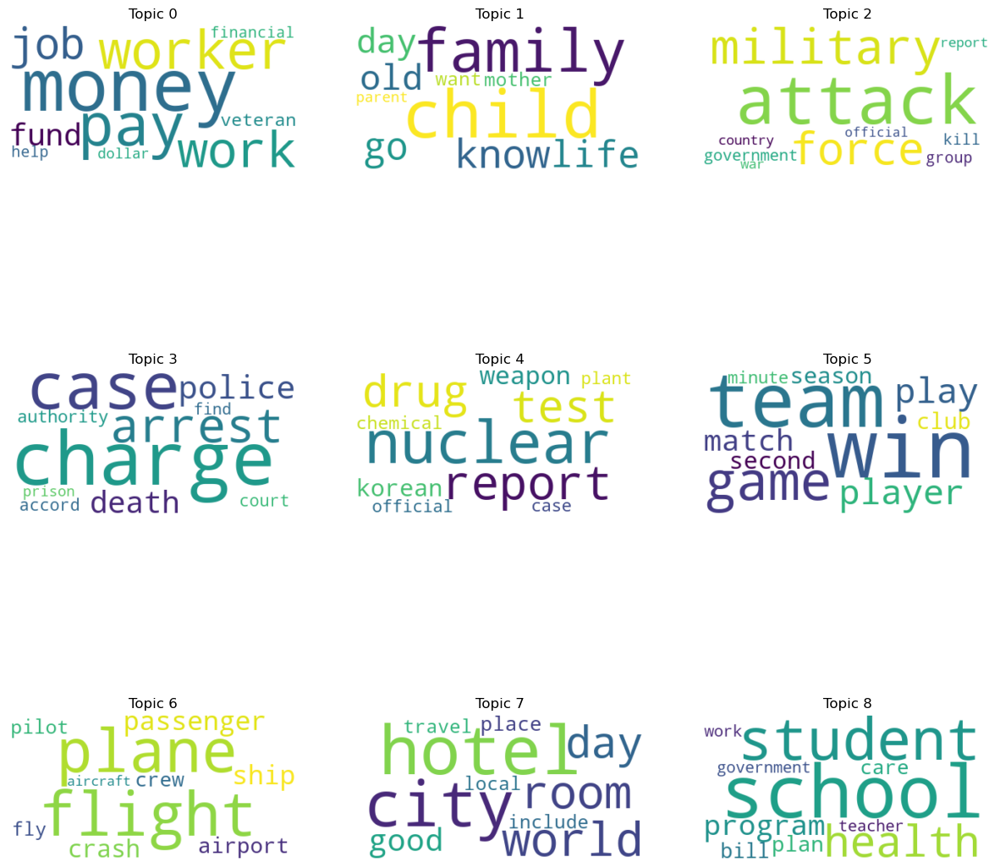

In [71]:
# Here we'll visualize the first nine topics.
render_word_cloud(lda_model, 3, 3, 10)

# Finding similar documents.

Gensim has a **similarities** module which can build an index for a given set of documents. Here, we're using **MatrixSimilarity** which computes cosine similarity across a corpus and stores them in an index.<br>
https://radimrehurek.com/gensim/similarities/docsim.html#gensim.similarities.docsim.MatrixSimilarity

In [72]:
lda_index = similarities.MatrixSimilarity(lda_model[corpus_bow_w_pos_filtered], num_features=len(dictionary_w_pos))

Here's a utility function to help retrieve the *first_m_words* of the *top_n* most similar documents. If you're curious about the *\_\_getitem\__* method on the LDA Model class, you can find the code here:<br>
https://github.com/RaRe-Technologies/gensim/blob/master/gensim/models/ldamodel.py

In [73]:
def get_similar_articles(index, model, article_bow, top_n=5, first_m_words=300):
  # model[article_bow] retrieves the topic distribution for the BOW.
  # index[model[article_bow] compares the topic distribution for the BOW against the similarity index previously computed.
  similar_docs = index[model[article_bow]]
  top_n_docs = sorted(enumerate(similar_docs), key=lambda item: -item[1])[1:top_n+1]

  # Return a list of tuples with each tuple: (article id, similarity score, first_m_words of article)
  return list(map(lambda entry: (entry[0], entry[1], articles[entry[0]][:first_m_words]), top_n_docs))

In [74]:
article_idx = 0
print(dataset[article_idx][:snippet_length], '\n')
get_similar_articles(lda_index, lda_model, corpus_bow_w_pos_filtered[article_idx])

 -- Children in war-ravaged Afghanistan are safer than those growing up in London or New York, NATO's top civilian envoy says.

Mark Sedwill, the senior civilian representative for NATO, made the comments on an episode of CBBC's "Newsround," which is airing Monday.

In the show -- a BBC current-affa 



[(6792,
  0.9734569,
  "\n -- It's been more than three weeks since militants from the dreaded Boko Haram terrorist group dragged 276 girls out of their beds at a boarding school in northern Nigeria, and still no one knows where the girls are. International assistance has begun to flow into Nigeria, whose president has vowe"),
 (5475,
  0.9606427,
  '\n -- A United States soldier captured by the Taliban says in a video posted on the Internet he is "scared I won\'t be able to go home."\n\nPfc. Bowe Bergdahl shown here in a video made by his captors, members of the Taliban.\n\nThe soldier was identified Sunday by the Pentagon as Pfc. Bowe R. Bergdahl, 2'),
 (6612,
  0.95879036,
  '\nThe fate of two Japanese men whom ISIS kidnapped and threatened to execute was unknown Friday as the 72-hour deadline that the militant group set apparently came and went.\n\nOn Tuesday, ISIS released a video threatening to kill the two men -- Kenji Goto and Haruna Yukawa -- unless Japan paid the gro'),
 (425

In [ ]:
article_idx = 10
print(dataset[article_idx][:snippet_length], '\n')
get_similar_articles(lda_index, lda_model, corpus_bow_w_pos_filtered[article_idx])

In [ ]:
article_idx = 100
print(dataset[article_idx][:snippet_length], '\n')
get_similar_articles(lda_index, lda_model, corpus_bow_w_pos_filtered[article_idx])

We can also query for documents similar to new, unseen documents. Below are short, actual blurbs from 2021 involving stock options and crime. Keep in mind that if this were a really old news corpus, then excerpts about cryptocurrencies and social media probably won't lead to good matches. This is another aspect to keep in mind when thinking about your data and use cases.

In [ ]:
test_article = "Capricorn Business Acquisitions Inc. (TSXV: CAK.H) (the “Company“) is pleased to announce that its board has approved the issuance of 70,000 stock options (“Stock Options“) to directors on April 19, 2020."

article_tokens = list(map(improved_filter, [nlp(test_article)]))[0]
article_bow = dictionary_w_pos.doc2bow(article_tokens)
get_similar_articles(lda_index, lda_model, article_bow)

In [ ]:
test_article = "DEA agent sentenced to 12 years in prison for conspiring with Colombian drug cartel."

article_tokens = list(map(improved_filter, [nlp(test_article)]))[0]
article_bow = dictionary_w_pos.doc2bow(article_tokens)
get_similar_articles(lda_index, lda_model, article_bow)

# Closing Thoughts and things to explore.
- Gensim infers topic and word distributions through [Variational Bayes (VB)](https://en.wikipedia.org/wiki/Variational_Bayesian_methods), not Gibbs Sampling. From the topics I've seen, Gibbs Sampling tends to lead to more interpretable topics, but VB is faster and Gensim offers the additional benefits of streaming documents, online learning, and training across a cluster of machines.
- Another topic modelling library, [Mallet](http://mallet.cs.umass.edu/), infers through Gibbs Sampling but is Java-based. Unfortunately, Gensim 4.0+ no longer offers a wrapper around Mallet. But if you're comfortable with Java, it may be worth exploring.
- Scikit-learn offers an [LDA model](https://scikit-learn.org/stable/modules/generated/sklearn.decomposition.LatentDirichletAllocation.html). Maybe as an exercise, try using that LDA model on the [20 Newsgroups](https://scikit-learn.org/0.19/datasets/twenty_newsgroups.html) dataset (or ideally, a dataset with longer documents).
- [pyLDAvis](https://github.com/bmabey/pyLDAvis) is another means of visualizing topic models. You can see it in action in this [notebook](https://nbviewer.jupyter.org/github/bmabey/pyLDAvis/blob/master/notebooks/pyLDAvis_overview.ipynb). See if you can get it working on your own topic model.
- LDA tends to work better on longer documents, and whether a topic model is "good" depends on your use case rather than strictly on a quantitative metric.